In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import mannwhitneyu, wilcoxon
import numpy as np
import os

In [2]:
# baselines = {file[5:-4] : pd.read_csv('../main/log/res/results_def/' + file, names=["algo", "experiment_id", "dataset", "seed", "generation",
#                                         "training_fitness", "timing", "pop_node_count",
#                                         "test_fitness", "elite_size", "log_level"]) for file in os.listdir('../main/log/res/results_def')}

In [3]:
# baselines.keys()

In [4]:
logger_name = '../main/log_crossover' + "/onlyxo_22oct.csv"

data = pd.read_csv(logger_name, names=["algo", "experiment_id", "dataset", "seed", "generation",
                                        "training_fitness", "timing", "pop_node_count",
                                        "test_fitness", "elite_size", "log_level"])

C:\Users\dfarinati\AppData\Local\Temp\ipykernel_15988\1515447341.py:3: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(logger_name, names=["algo", "experiment_id", "dataset", "seed", "generation",


In [5]:
data.drop_duplicates(subset = ["algo", "experiment_id", "dataset", "seed", "generation"], keep = 'last', inplace = True)

In [6]:
data.algo.unique()

array(['SlimGSGP_1_mul_True_sc_0.2', 'SlimGSGP_1_mul_True_sc_0.5',
       'SlimGSGP_1_mul_True_sc_0.8', 'SlimGSGP_1_mul_True_sdc-0.3_0.2',
       'SlimGSGP_1_mul_True_sdc-0.3_0.5',
       'SlimGSGP_1_mul_True_sdc-0.3_0.8',
       'SlimGSGP_1_mul_True_sdc-0.7_0.2',
       'SlimGSGP_1_mul_True_sdc-0.7_0.5',
       'SlimGSGP_1_mul_True_sdc-0.7_0.8', 'SlimGSGP_1_mul_True_dgx_0.2',
       'SlimGSGP_1_mul_True_dgx_0.5', 'SlimGSGP_1_mul_True_dgx_0.8',
       'SlimGSGP_1_mul_True_no_xo_0', 'SlimGSGP_1_mul_False_sc_0.2',
       'SlimGSGP_1_mul_False_sc_0.5', 'SlimGSGP_1_mul_False_sc_0.8',
       'SlimGSGP_1_mul_False_sdc-0.3_0.2',
       'SlimGSGP_1_mul_False_sdc-0.3_0.5',
       'SlimGSGP_1_mul_False_sdc-0.3_0.8',
       'SlimGSGP_1_mul_False_sdc-0.7_0.2',
       'SlimGSGP_1_mul_False_sdc-0.7_0.5',
       'SlimGSGP_1_mul_False_sdc-0.7_0.8', 'SlimGSGP_1_mul_False_dgx_0.2',
       'SlimGSGP_1_mul_False_dgx_0.5', 'SlimGSGP_1_mul_False_dgx_0.8',
       'SlimGSGP_1_mul_False_no_xo_0', 'SlimGSGP_2_s

In [7]:
data.dataset.unique()

array(['yatch', 'istanbul', 'resid_build_sale_price', 'airfoil',
       'concrete_strength', 'concrete_slump'], dtype=object)

In [8]:
algo_types = ['SlimGSGP_1_mul_True',  'SlimGSGP_2_sum_True'] #'SlimGSGP_1_mul_False',
dataset =['yatch', 'istanbul', 'resid_build_sale_price', 'airfoil',
       'concrete_strength', 'concrete_slump'] #, 'concrete_slump'

In [9]:
data['elite_size'] = pd.to_numeric(data['elite_size'], errors='coerce')

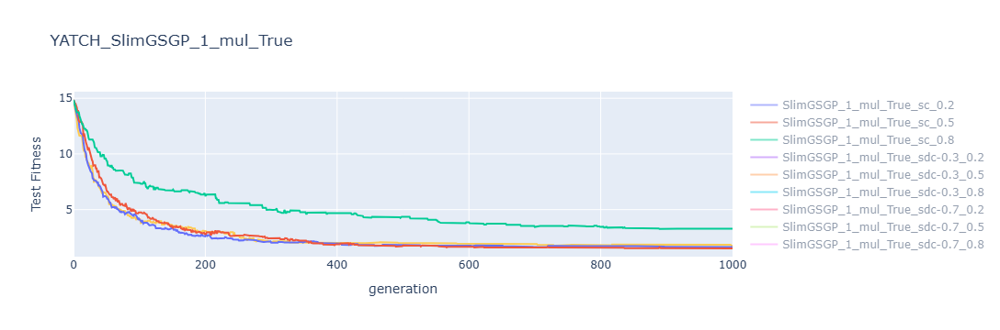

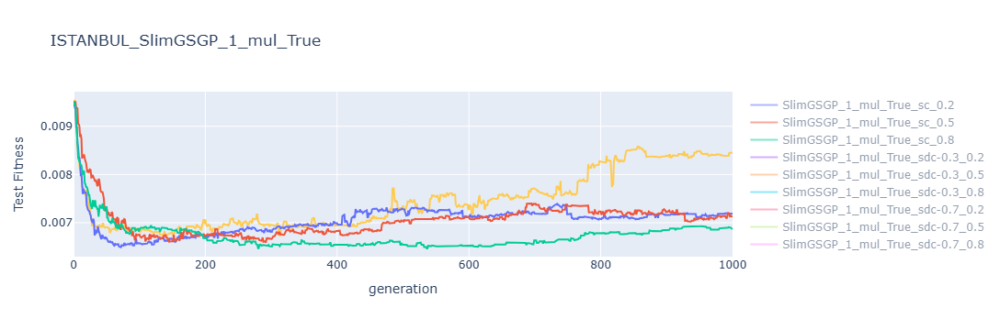

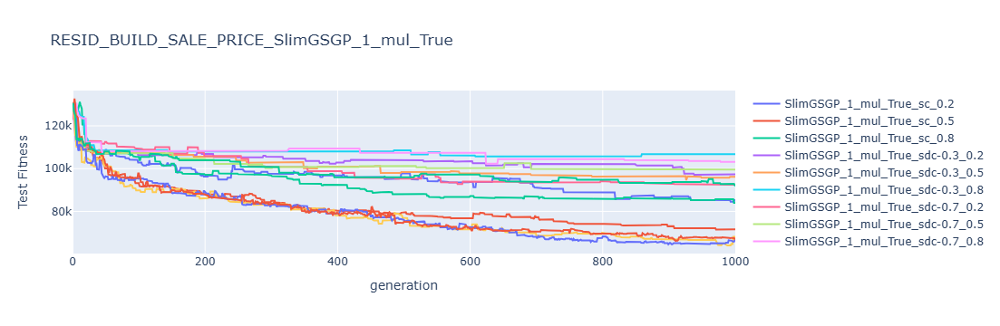

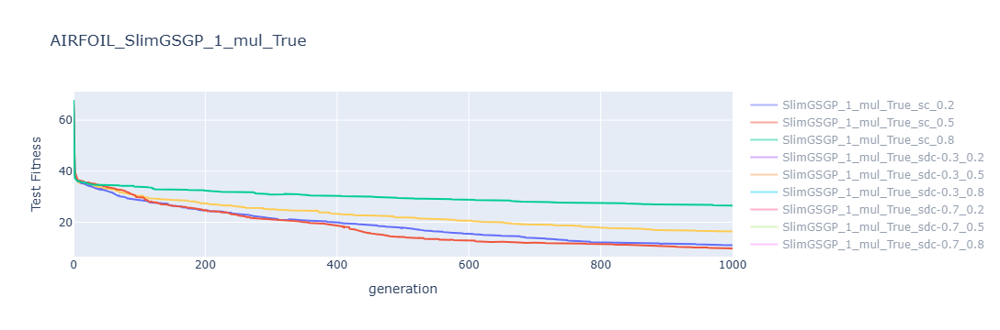

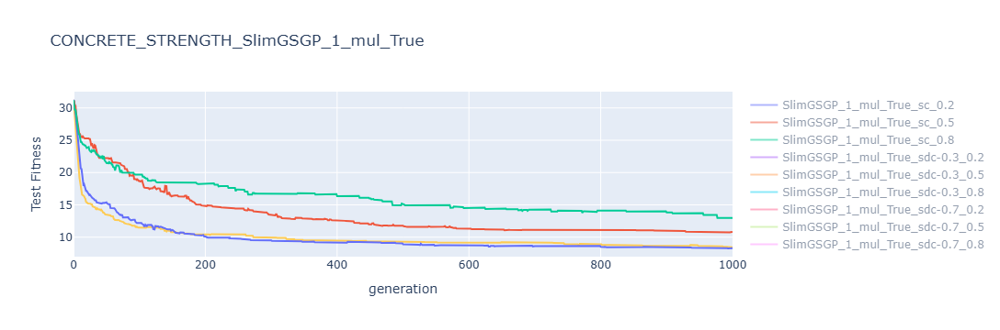

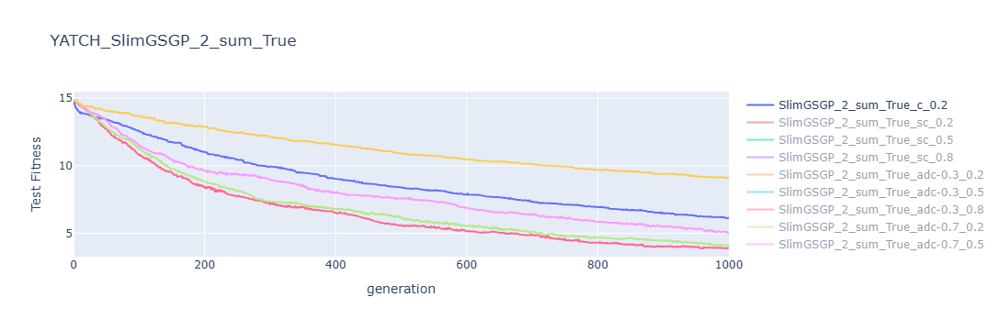

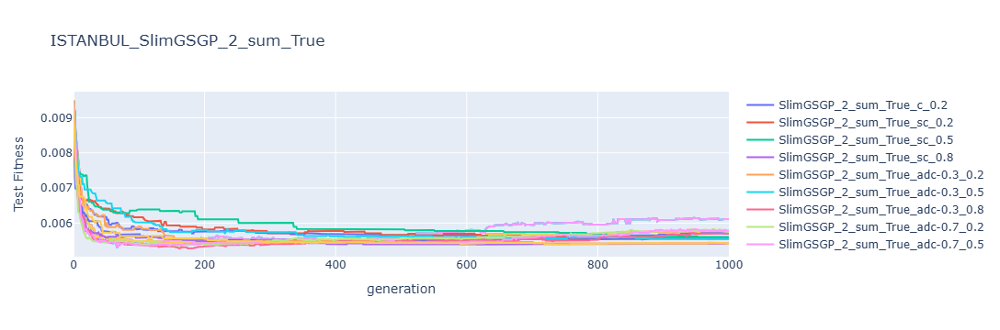

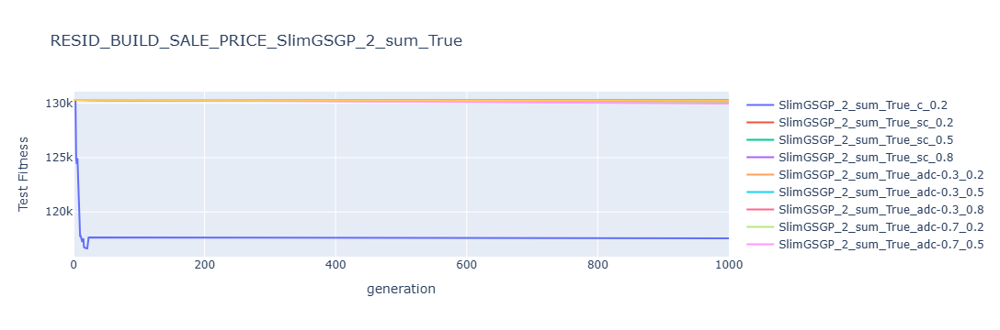

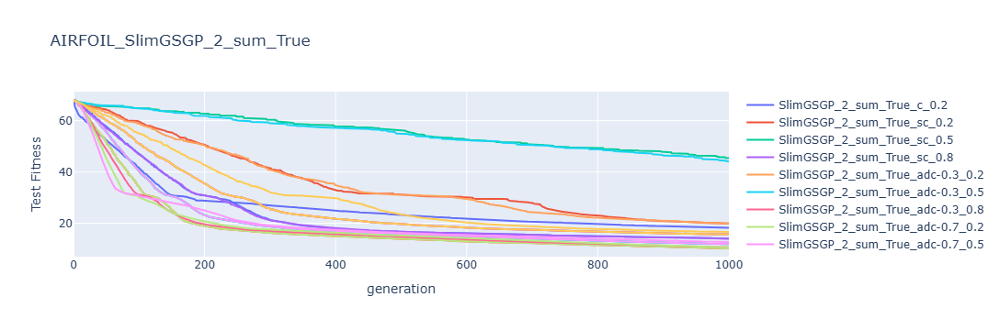

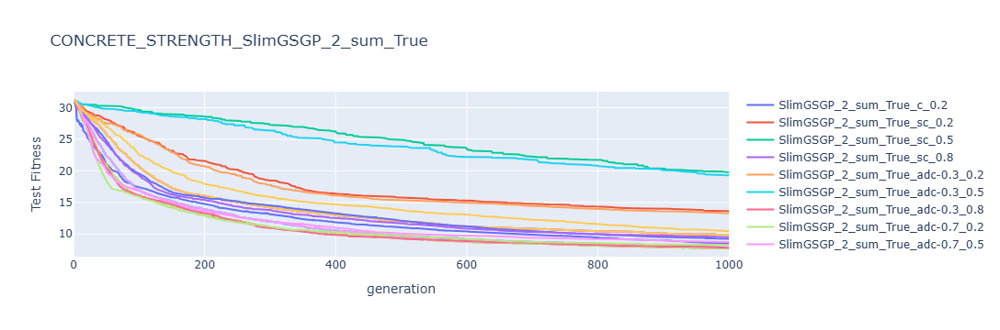

In [16]:
for algo_type in algo_types:
    for input_ in dataset:
        fig = go.Figure()
        for res_data in list(filter(lambda x: algo_type in x[:25], data.algo.unique())):
            data_fitered = data.query("dataset == @input_ and algo == @res_data")[['test_fitness', 'generation']].groupby('generation').median()
            
            fig.add_trace(go.Scatter(y=data_fitered['test_fitness'], x=data_fitered.index,
                              name = res_data))
            

        fig.update_layout(title_text=f'{input_.upper()}_{algo_type}',
                         xaxis_title="generation",
                         yaxis_title="Test Fitness") 
        fig.show()

In [10]:
variants = {"yatch" : ['SlimGSGP_1_mul_True_sc_0.2', 
                       'SlimGSGP_1_mul_True_sdc-0.7_0.2',
                       'SlimGSGP_1_mul_True_dgx_0.8',
                       'SlimGSGP_1_mul_True_no_xo_0',
                       'SlimGSGP_2_sum_True_c_0.2',
                       'SlimGSGP_2_sum_True_sc_0.8',
                       'SlimGSGP_2_sum_True_adc-0.7_0.2',
                       'SlimGSGP_2_sum_True_sdc-0.7_0.8',
                       'SlimGSGP_2_sum_True_dgx_0.8',
                       'SlimGSGP_2_sum_True_no_xo_0'],
            'istanbul':  ['SlimGSGP_1_mul_True_sc_0.8', 
                       'SlimGSGP_1_mul_True_sdc-0.7_0.8',
                       'SlimGSGP_1_mul_True_dgx_0.8',
                       'SlimGSGP_1_mul_True_no_xo_0',
                       'SlimGSGP_2_sum_True_c_0.2',
                       'SlimGSGP_2_sum_True_sc_0.2',
                       'SlimGSGP_2_sum_True_adc-0.7_0.2',
                       'SlimGSGP_2_sum_True_sdc-0.7_0.8',
                       'SlimGSGP_2_sum_True_dgx_0.8',
                       'SlimGSGP_2_sum_True_no_xo_0'],
            'airfoil':  ['SlimGSGP_1_mul_True_sc_0.5', 
                       'SlimGSGP_1_mul_True_sdc-0.7_0.5',
                       'SlimGSGP_1_mul_True_dgx_0.5',
                       'SlimGSGP_1_mul_True_no_xo_0',
                       'SlimGSGP_2_sum_True_c_0.2',
                       'SlimGSGP_2_sum_True_sc_0.5',
                       'SlimGSGP_2_sum_True_adc-0.7_0.2',
                       'SlimGSGP_2_sum_True_sdc-0.7_0.5',
                       'SlimGSGP_2_sum_True_dgx_0.5',
                       'SlimGSGP_2_sum_True_no_xo_0'],
        'concrete_strength':  ['SlimGSGP_1_mul_True_sc_0.5', 
                       'SlimGSGP_1_mul_True_sdc-0.7_0.5',
                       'SlimGSGP_1_mul_True_dgx_0.5',
                       'SlimGSGP_1_mul_True_no_xo_0',
                       'SlimGSGP_2_sum_True_c_0.2',
                       'SlimGSGP_2_sum_True_sc_0.5',
                       'SlimGSGP_2_sum_True_adc-0.7_0.2',
                       'SlimGSGP_2_sum_True_sdc-0.7_0.2',
                       'SlimGSGP_2_sum_True_dgx_0.8',
                       'SlimGSGP_2_sum_True_no_xo_0'],
                    'concrete_slump':  ['SlimGSGP_1_mul_True_sc_0.5', 
                       'SlimGSGP_1_mul_True_sdc-0.7_0.5',
                       'SlimGSGP_1_mul_True_dgx_0.5',
                       'SlimGSGP_1_mul_True_no_xo_0',
                       'SlimGSGP_2_sum_True_c_0.2',
                       'SlimGSGP_2_sum_True_sc_0.5',
                       'SlimGSGP_2_sum_True_adc-0.7_0.2',
                       'SlimGSGP_2_sum_True_sdc-0.7_0.2',
                       'SlimGSGP_2_sum_True_dgx_0.8',
                       'SlimGSGP_2_sum_True_no_xo_0']
           }
            
            

In [19]:
baseline

array([], dtype=float64)

In [23]:
for algo_type in algo_types:
    print(algo_type)
    for input_ in ['yatch', 'istanbul', 'airfoil','concrete_strength', 'concrete_slump']:
        print(input_)
        base_algo = algo_type + '_no_xo_0'
        baseline = data.query("dataset == @input_ and algo == @base_algo and generation == 1000")['test_fitness'].values
        for res_data in list(filter(lambda x: algo_type in x[:25] and '_no_xo_0' not in x, variants[input_])):
            values = data.query("dataset == @input_ and algo == @res_data and generation == 1000")['test_fitness'].values
            print(res_data[20:], mannwhitneyu(baseline, values)[1])
        print('\n')
    print('\n')

SlimGSGP_1_mul_True
yatch
sc_0.2 0.0015968867051760125
sdc-0.7_0.2 0.0007697288698323855
dgx_0.8 5.599907101277584e-07


istanbul
sc_0.8 0.2518808246619123
sdc-0.7_0.8 0.31830422747222764
dgx_0.8 0.11536235969206284


airfoil
sc_0.5 3.019859359162157e-11
sdc-0.7_0.5 6.527736457495676e-08
dgx_0.5 3.019859359162157e-11


concrete_strength
sc_0.5 0.0019526766739305424
sdc-0.7_0.5 0.01911239675982854
dgx_0.5 8.197497229004642e-07


concrete_slump
sc_0.5 0.19073033347156776
sdc-0.7_0.5 0.8766349003139949
dgx_0.5 0.03513659994217983




SlimGSGP_2_sum_True
yatch
c_0.2 3.158889488129529e-10
sc_0.8 0.10546994652177778
adc-0.7_0.2 4.5125751719819824e-12
sdc-0.7_0.8 1.4643068877150338e-10
dgx_0.8 8.993406027014868e-11


istanbul
c_0.2 0.03265093917842125
sc_0.2 0.5692201637415295
adc-0.7_0.2 0.7160324411448704
sdc-0.7_0.8 0.9469559422255942
dgx_0.8 0.006972441494570254


airfoil
c_0.2 0.004427193167173018
sc_0.5 0.000856411554987191
adc-0.7_0.2 0.00029888306366433607
sdc-0.7_0.5 0.00262428006436

In [11]:
for algo_type in algo_types:
    for input_ in ['yatch', 'istanbul', 'airfoil','concrete_strength', 'concrete_slump']:
        for res_data in list(filter(lambda x: algo_type in x[:25], variants[input_])):
            data_fitered = data.query("dataset == @input_ and algo == @res_data and generation % 2 == 0")[['test_fitness','elite_size', 'generation']].groupby('generation').median()
            data_fitered['elite_size'] = data_fitered['elite_size'].apply(lambda x: 10000 if x>10000 else x)
            data_fitered.to_csv(f"evo_data/{res_data}_{input_}.csv", header = None)

In [12]:
def convert(x):
    if '_sc_' in x:
        return 'SwapXO'
    elif '_sdc' in x:
        return 'SwapDeflateXO'
    elif 'no_xo' in x:
        return 'SLIM'
    elif 'adc' in x:
        return 'AlphaDeflateXO'
    elif 'dgx' in x:
        return 'DonorXO'
    elif '_c_' in x:
        return 'GXO'

In [15]:
import math
# for input_ in ['yatch', 'istanbul', 'airfoil','concrete_strength', 'concrete_slump']:
    # print(input_)
for algo_type in algo_types:
    print(algo_type)
    algosss = list(filter(lambda x: algo_type in x[:25], variants[input_]))
    data_fitered = data.query("algo in @algosss and generation == 1000")[['test_fitness','elite_size', 'algo']].groupby('algo').median()
    # if algo_type == 'SlimGSGP_2_sum_True':
    data_fitered['elite_size'] = data_fitered['elite_size'].apply(lambda x : math.log(x, 10))
    data_fitered.index = data_fitered.index.map(convert)
    # data_fitered.to_csv(f"xo txt data pareto/{algo_type}_{input_}.txt", header = None, sep =  '\t')
    data_fitered.reset_index(inplace = True)
    print(data_fitered.values)
print('\n')

SlimGSGP_1_mul_True
[['DonorXO' 7.8692545890808105 3.0503797562614574]
 ['SLIM' 10.267887115478516 2.217483944213906]
 ['SwapXO' 8.850254535675049 3.0077477780007396]
 ['SwapDeflateXO' 11.068274021148682 2.436162647040756]]
SlimGSGP_2_sum_True
[['AlphaDeflateXO' 7.741815567016602 4.170716312824286]
 ['GXO' 8.208500385284424 63.82139917523142]
 ['DonorXO' 9.01526403427124 3.913919764951465]
 ['SLIM' 9.960324287414553 3.491361693834272]
 ['SwapXO' 8.093615531921387 3.8262692193937258]
 ['SwapDeflateXO' 9.003161907196045 4.152792689376756]]




In [17]:
import math
# for input_ in ['yatch', 'istanbul', 'airfoil','concrete_strength', 'concrete_slump']:
    # print(input_)
for algo_type in algo_types:
    print(algo_type)
    print('test_fitness','elite_size', 'timing')
    algosss = list(filter(lambda x: algo_type in x[:25], variants[input_]))
    data_fitered = data.query("algo in @algosss and generation == 1000")[['test_fitness','elite_size', 'timing', 'algo']].groupby('algo').median()
    # if algo_type == 'SlimGSGP_2_sum_True':
    # data_fitered['elite_size'] = data_fitered['elite_size'].apply(lambda x : math.log(x, 10))
    data_fitered.index = data_fitered.index.map(convert)
    # data_fitered.to_csv(f"xo txt data pareto/{algo_type}_{input_}.txt", header = None, sep =  '\t')
    data_fitered.reset_index(inplace = True)
    print(data_fitered.values)
print('\n')

SlimGSGP_1_mul_True
test_fitness elite_size timing
[['DonorXO' 7.8692545890808105 1123.0 0.0627459287643432]
 ['SLIM' 10.267887115478516 165.0 0.02208805084228515]
 ['SwapXO' 8.850254535675049 1018.0 0.06945443153381345]
 ['SwapDeflateXO' 11.068274021148682 273.0 0.020550489425659152]]
SlimGSGP_2_sum_True
test_fitness elite_size timing
[['AlphaDeflateXO' 7.741815567016602 14815.5 0.3002921342849731]
 ['GXO' 8.208500385284424 6.628254498353786e+63 0.9470914602279663]
 ['DonorXO' 9.01526403427124 8202.0 0.13171124458312986]
 ['SLIM' 9.960324287414553 3100.0 0.08201456069946285]
 ['SwapXO' 8.093615531921387 6703.0 0.19190049171447748]
 ['SwapDeflateXO' 9.003161907196045 14216.5 0.30312442779541016]]




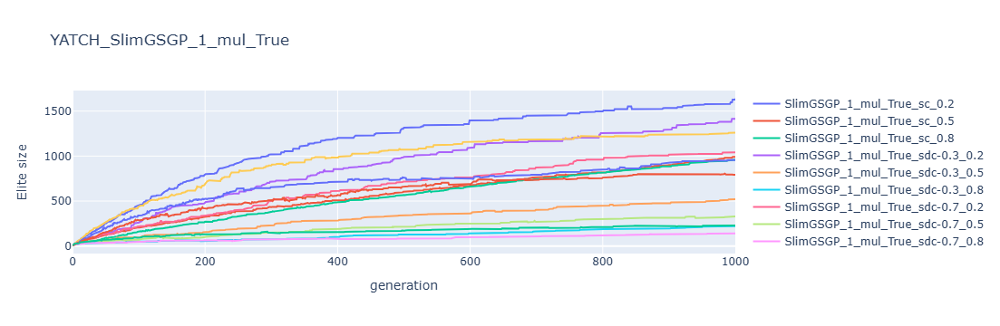

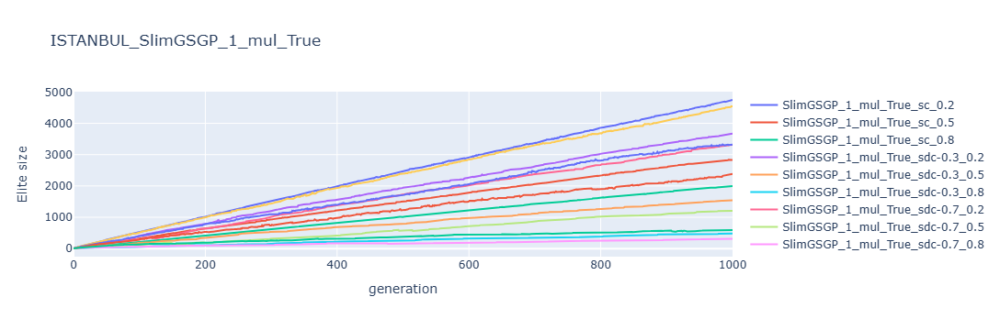

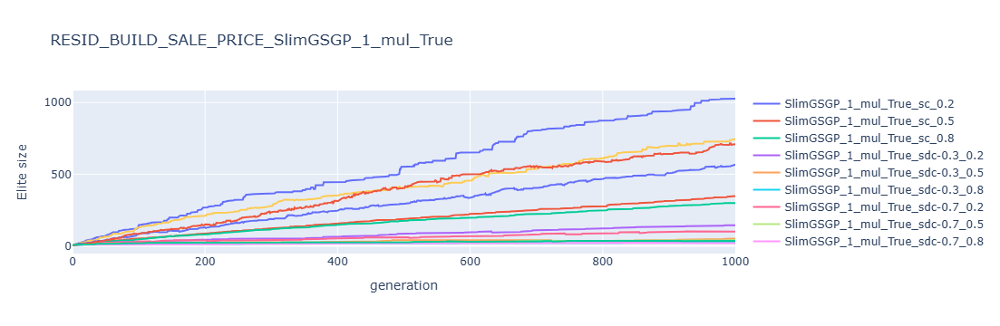

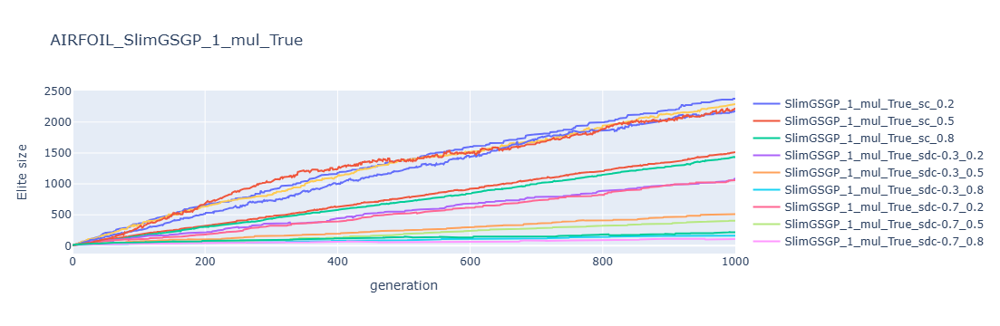

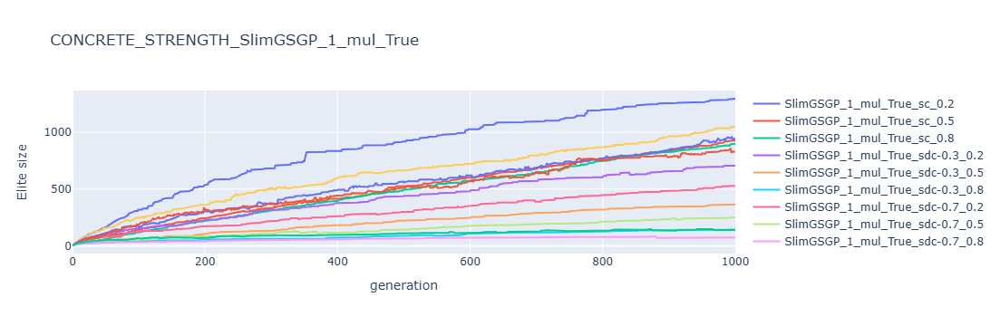

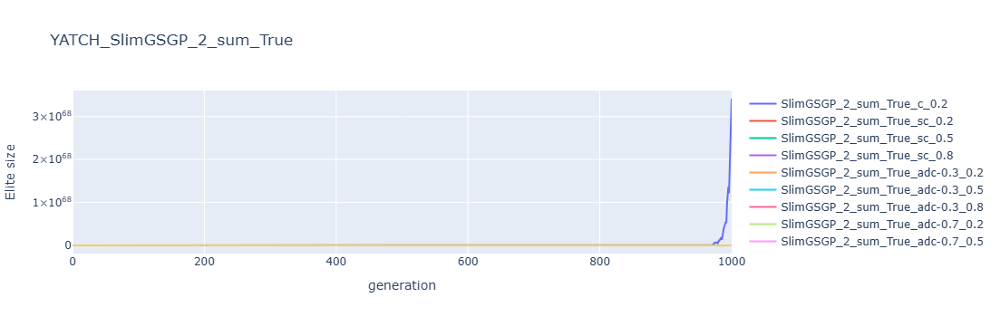

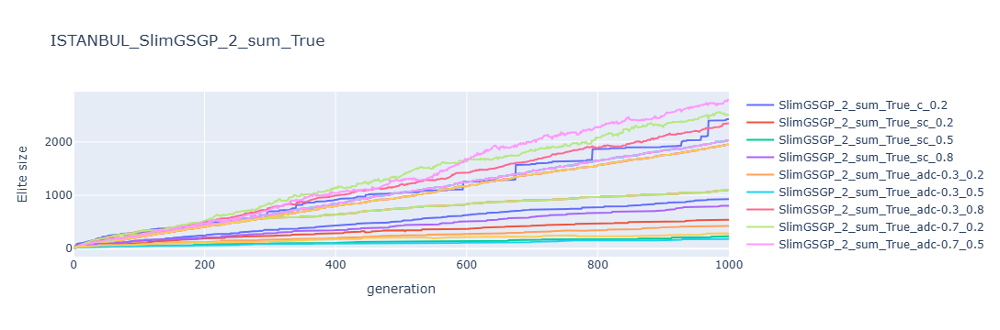

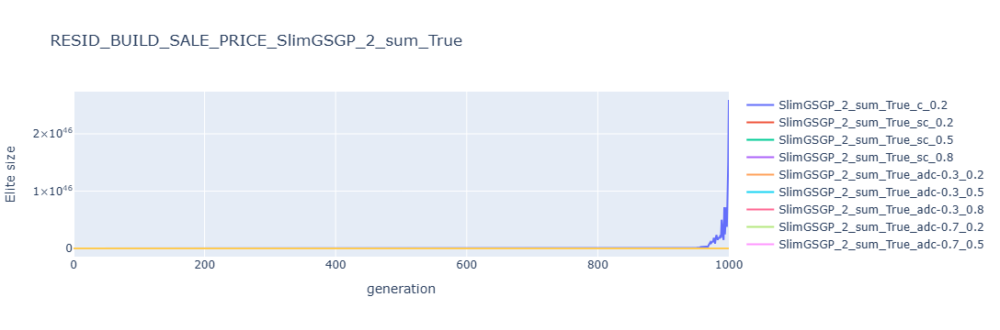

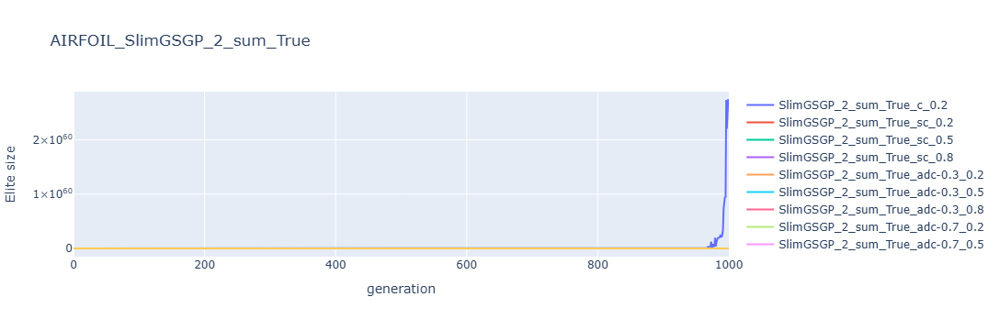

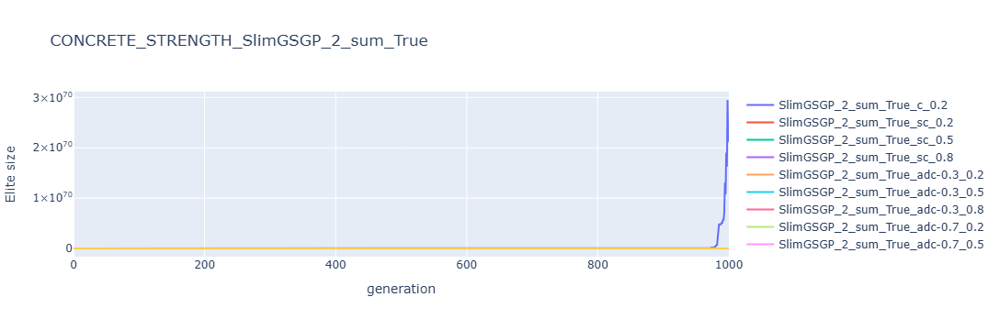

In [19]:
for algo_type in algo_types:
    for input_ in dataset:
        fig = go.Figure()
        for res_data in list(filter(lambda x: algo_type in x[:25], data.algo.unique())):
            data_fitered = data.query("dataset == @input_ and algo == @res_data")[['elite_size', 'generation']].groupby('generation').median()
            
            fig.add_trace(go.Scatter(y=data_fitered['elite_size'], x=data_fitered.index,
                              name = res_data))
        
        fig.update_layout(title_text=f'{input_.upper()}_{algo_type}',
                         xaxis_title="generation",
                         yaxis_title="Elite size") 

        
        
        # fig.update_layout(yaxis=dict(range=[0,2500]))
        fig.show()